In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta, timezone
import glob
import os
from tqdm.notebook import tqdm
from Helpers import extract_metadata 
import math

Helpers.py loaded successfully.


In [6]:
# Redefine plotting function to accept full path (no repeated imports)
def plot_file_spectrogram(file_path, ax):
    """Loads, processes, and plots the full spectrogram for a single file.
       file_path must be a full path to the .hdf5 file."""
    if not os.path.exists(file_path):
        ax.set_title(f"File Not Found: {os.path.basename(file_path)}")
        ax.axis('off')
        return

    # 1. Load Data and Metadata
    start_time, dt, _, channels_raw, num_samples_raw = extract_metadata(file_path)
    with h5py.File(file_path, 'r') as f:
        data_raw = f['data'][:]

    dmin_km = 19.5
    dmax_km = 22
    # 2. Apply Masking/Downsampling (use notebook's CHANNEL_STEP and SAMPLE_STEP)
    distance_array_m = channels_raw * dx
    distance_array_km = distance_array_m / 1000.0
    dist_mask = (distance_array_km >= dmin_km) & (distance_array_km <= dmax_km)

    combined_data = data_raw[::SAMPLE_STEP, dist_mask][:, ::CHANNEL_STEP]
    distances = distance_array_km[dist_mask][::CHANNEL_STEP]

    # 3. Create Time Axis
    file_start_datetime = datetime.fromtimestamp(start_time, tz=timezone.utc)
    num_samples = combined_data.shape[0]
    time_deltas = np.arange(0, num_samples) * (dt * SAMPLE_STEP)
    time_axis = [file_start_datetime + timedelta(seconds=float(t)) for t in time_deltas]

    # 4. Vmax for plotting
    vmax_amp = np.percentile(np.abs(combined_data), 99)

    # 5. Plot
    img = ax.imshow(np.abs(combined_data),
                    aspect='auto',
                    extent=[distances[0], distances[-1],
                            mdates.date2num(time_axis[0]),
                            mdates.date2num(time_axis[-1])],
                    cmap='jet',
                    vmin=-vmax_amp/2,
                    vmax=vmax_amp/2)

    ax.yaxis_date()
    ax.yaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_title(os.path.basename(file_path))
    ax.set_ylabel('Time (UTC)')
    ax.set_xlabel('Distance (km)')

    # per-subplot colorbar (optional); comment out if too cluttered
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label='Amplitude (rad/s*m)')

Found 341 files in data/GC_data\20250702


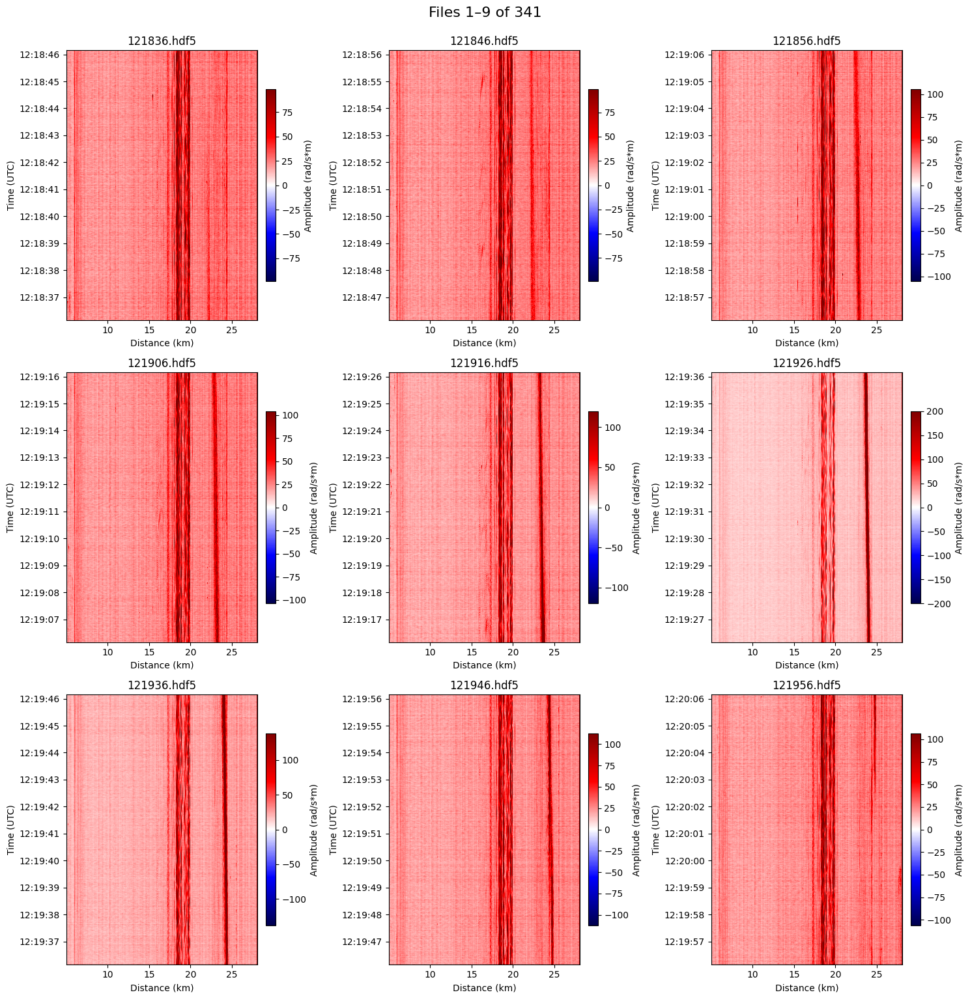

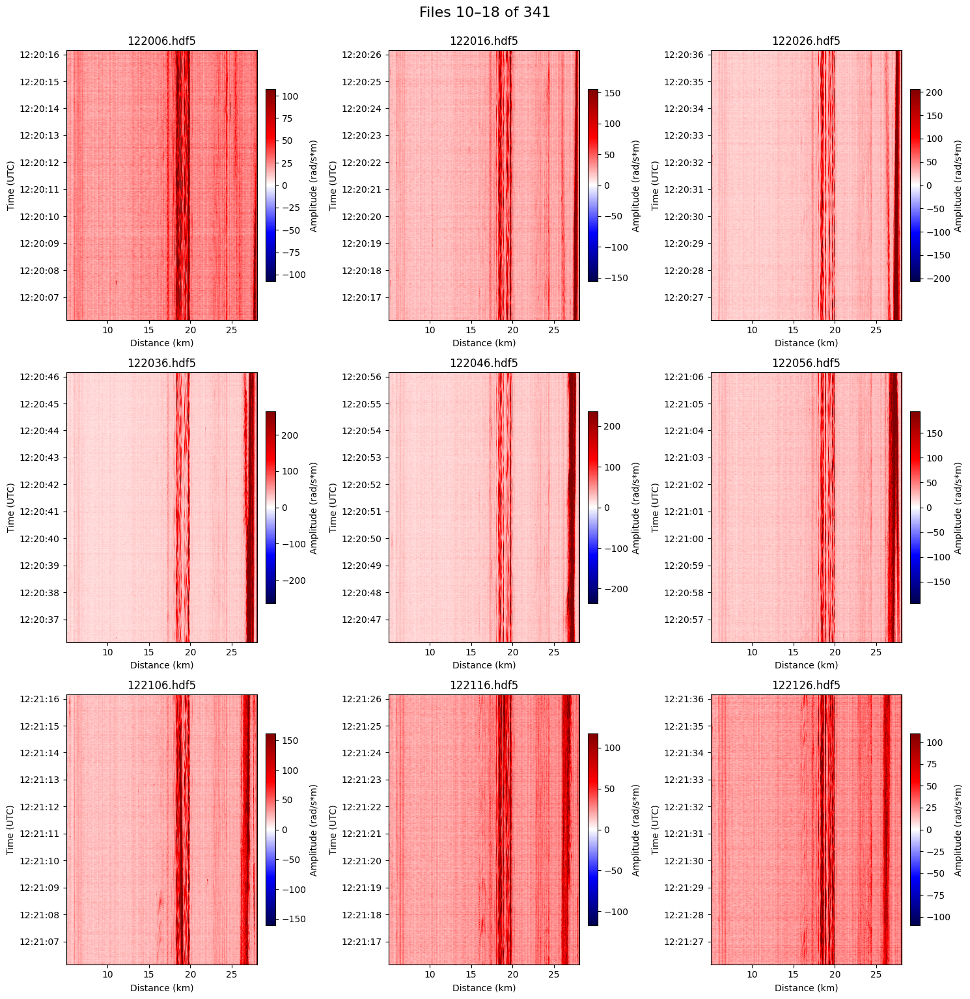

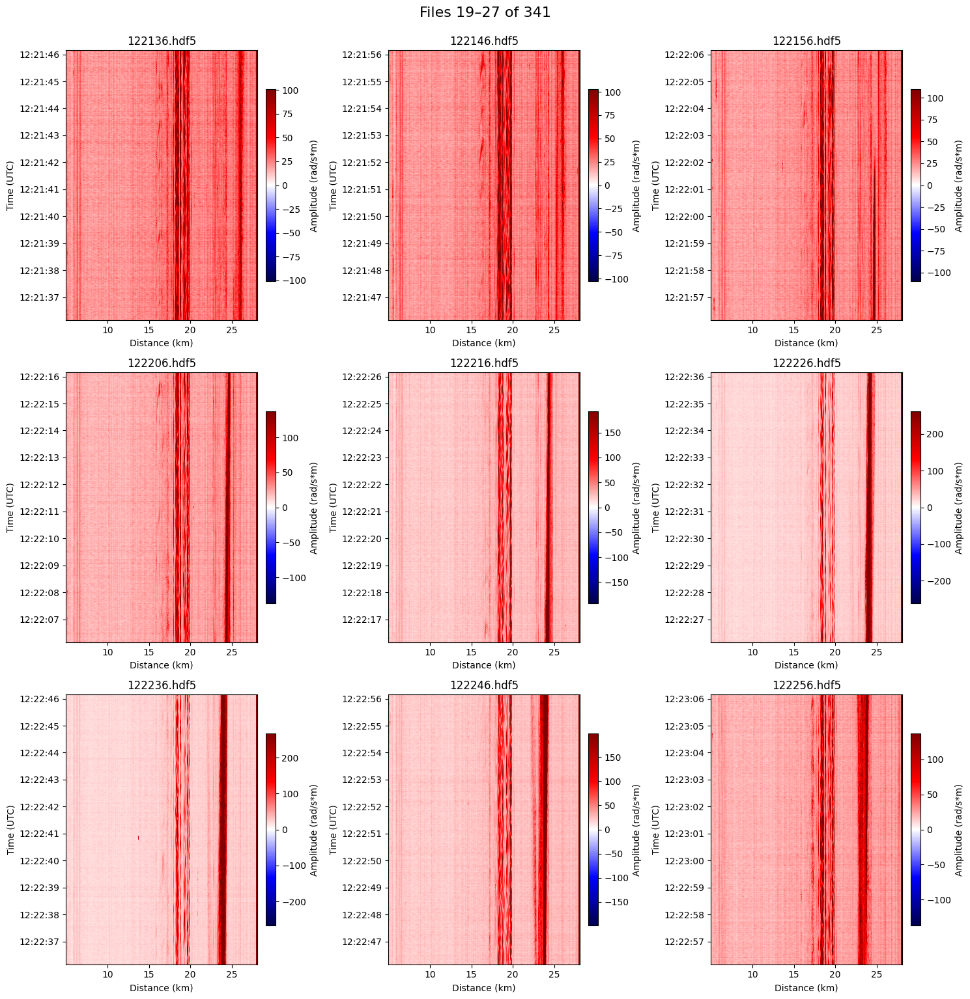

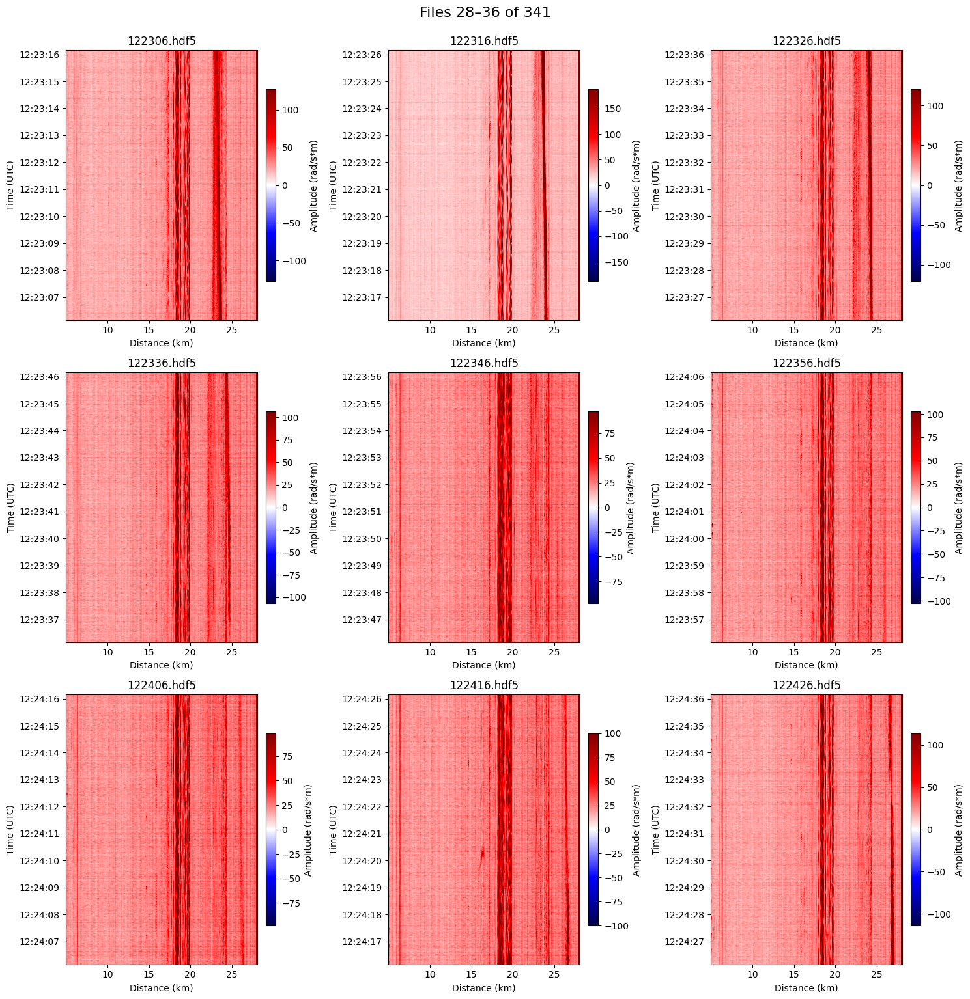

KeyboardInterrupt: 

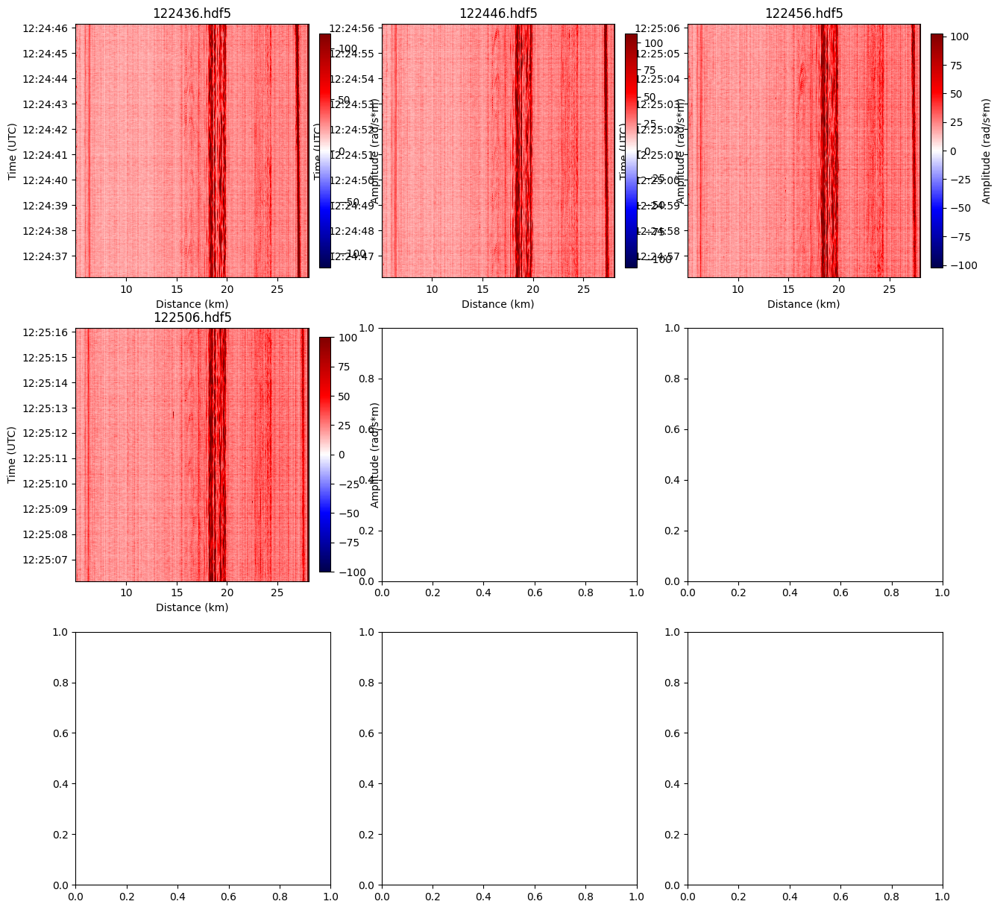

In [ ]:
directory = "data/GC_data"
dmin_km = 19.5
dmax_km = 22

# Redefine plotting function to accept full path (no repeated imports)
def plot_file_spectrogram(file_path, ax):
    """Loads, processes, and plots the full spectrogram for a single file.
       file_path must be a full path to the .hdf5 file."""
    if not os.path.exists(file_path):
        ax.set_title(f"File Not Found: {os.path.basename(file_path)}")
        ax.axis('off')
        return

    # 1. Load Data and Metadata
    start_time, dt, _, channels_raw, num_samples_raw = extract_metadata(file_path)
    with h5py.File(file_path, 'r') as f:
        data_raw = f['data'][:]

    dmin_km = 19.5
    dmax_km = 22
    # 2. Apply Masking/Downsampling (use notebook's CHANNEL_STEP and SAMPLE_STEP)
    distance_array_m = channels_raw * dx
    distance_array_km = distance_array_m / 1000.0
    dist_mask = (distance_array_km >= dmin_km) & (distance_array_km <= dmax_km)

    combined_data = data_raw[::SAMPLE_STEP, dist_mask][:, ::CHANNEL_STEP]
    distances = distance_array_km[dist_mask][::CHANNEL_STEP]

    # 3. Create Time Axis
    file_start_datetime = datetime.fromtimestamp(start_time, tz=timezone.utc)
    num_samples = combined_data.shape[0]
    time_deltas = np.arange(0, num_samples) * (dt * SAMPLE_STEP)
    time_axis = [file_start_datetime + timedelta(seconds=float(t)) for t in time_deltas]

    # 4. Vmax for plotting
    vmax_amp = np.percentile(np.abs(combined_data), 99)

    # 5. Plot
    img = ax.imshow(np.abs(combined_data),
                    aspect='auto',
                    extent=[distances[0], distances[-1],
                            mdates.date2num(time_axis[0]),
                            mdates.date2num(time_axis[-1])],
                    cmap='jet',
                    vmin=-vmax_amp/2,
                    vmax=vmax_amp/2)

    ax.yaxis_date()
    ax.yaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    ax.set_title(os.path.basename(file_path))
    ax.set_ylabel('Time (UTC)')
    ax.set_xlabel('Distance (km)')

    # per-subplot colorbar (optional); comment out if too cluttered
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label='Amplitude (rad/s*m)')


# Locate the target folder for 20250702 (try a few likely paths)
candidates = [
    os.path.join(directory, '20250702'),
    os.path.join(directory, '20250702'.replace('-', '')),  # fallback
    os.path.join('data', 'GC_Data', '20250702'),
    os.path.join('data', 'GC_data', '20250702'),
    os.path.join(os.path.dirname(first_path), '20250702')
]
target_dir = next((p for p in candidates if os.path.isdir(p)), None)
if target_dir is None:
    raise FileNotFoundError("Could not find directory for 20250702. Checked: " + ", ".join(candidates))

# Gather HDF5 files and make absolute paths
files = sorted(glob.glob(os.path.join(target_dir, '*.hdf5')) + glob.glob(os.path.join(target_dir, '*.h5')))
files = [os.path.abspath(p) for p in files]

if not files:
    print(f"No HDF5 files found in {target_dir}")
else:
    print(f"Found {len(files)} files in {target_dir}")


# Batch plot all files into 3x3 grids
n_files = len(files)
group_size = 9  # 3x3
n_figs = math.ceil(n_files / group_size)

for fig_idx in range(n_figs):
    start = fig_idx * group_size
    end = min(start + group_size, n_files)
    chunk = files[start:end]

    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    axs = axs.flatten()

    for i in range(group_size):
        ax = axs[i]
        if i < len(chunk):
            plot_file_spectrogram(chunk[i], ax)
        else:
            ax.axis('off')  # empty slot

    plt.tight_layout()
    plt.suptitle(f'Files {start+1}–{end} of {n_files}', y=1.02, fontsize=16)
    plt.show()


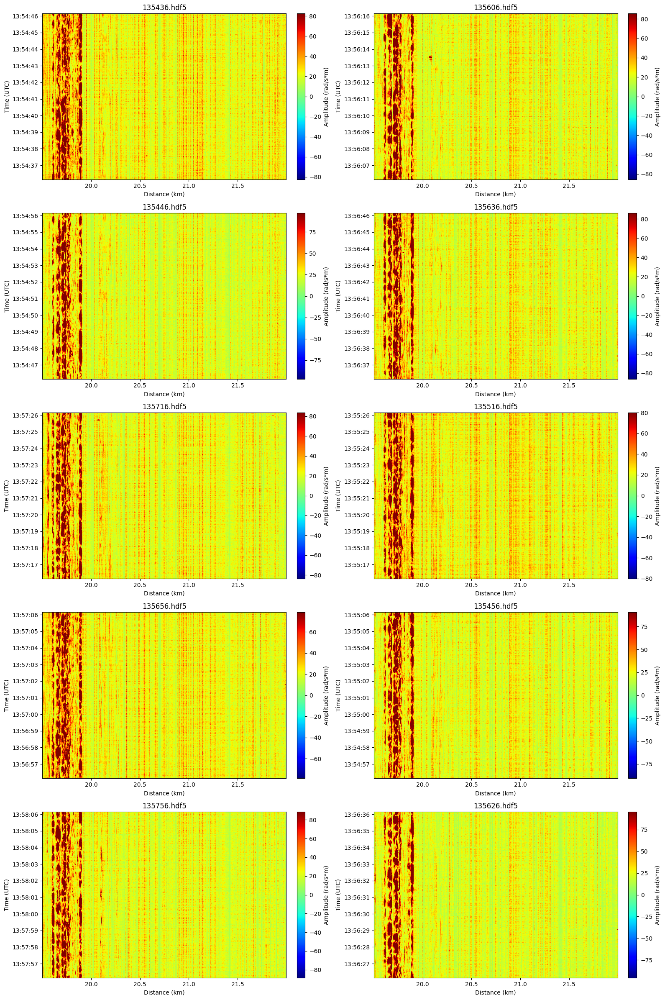

In [7]:
# Plot the 10 specified anomalous files in a 5x2 grid, limited to 19.5-22 km
anomalous_basenames = [
    '135436.hdf5', '135606.hdf5', '135446.hdf5', '135636.hdf5', '135716.hdf5',
    '135516.hdf5', '135656.hdf5', '135456.hdf5', '135756.hdf5', '135626.hdf5'
]

directory = "data/GC_data/20250702"  # Use the previously determined target directory

# Build absolute paths
anomalous_files = [os.path.abspath(os.path.join(directory, bn)) for bn in anomalous_basenames]

# Quick existence check
for p in anomalous_files:
    if not os.path.exists(p):
        print(f"Warning: file not found: {p}")

# Ensure preprocessing config (match model preprocessing)
CHANNEL_STEP = 2
SAMPLE_STEP = 1

# Ensure dx is available for plotting function
first_path = anomalous_files[0]
dx = extract_metadata(first_path)[2]

# Override dmin/dmax in the notebook scope (plot_file_spectrogram already uses 19.5/22 internally,
# but keep these consistent here)
dmin_km, dmax_km = 19.5, 22.0

# Create 5x2 plot grid
fig, axes = plt.subplots(5, 2, figsize=(16, 24))
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < len(anomalous_files):
        plot_file_spectrogram(anomalous_files[i], ax)
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()
